In [1]:
# -*- coding: utf-8 -*-
#  Copyright 2026 United Kingdom Research and Innovation
#
#  Licensed under the Apache License, Version 2.0 (the "License");
#  you may not use this file except in compliance with the License.
#  You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
#  Unless required by applicable law or agreed to in writing, software
#  distributed under the License is distributed on an "AS IS" BASIS,
#  WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
#  See the License for the specific language governing permissions and
#  limitations under the License.
#
#  Authored by:  Laura Murgatroyd (UKRI-STFC)

# SIRT Applied to Reduced Data

This notebook demonstrates applying SIRT - an iterative reconstruction algorithm - to data with reduced exposure time and number of projections. The results are compared to FBP of the full data.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
from cil.utilities.display import show1D, show2D
from cil.processors import Slicer
from recon.weighted_fbp import run_weighted_fbp_parallel
from cil.io import TIFFStackReader
from cil.framework import DataContainer

import warnings
warnings.filterwarnings("ignore")

Here we use a method  from `data_io` to load the data listed in the above table. The data we load here has already been pre-processed in Mantid Imaging.

In [3]:
from data_io.alum_cyl_io import read_processed_data

In [4]:
exp_1min_angles_840 = read_processed_data(exposure_time=60, num_angles=840)
exp_30s_angles_210 = read_processed_data(exposure_time=30, num_angles=210)

processed_data_dict = {'FBP [1min, 840 angles]': exp_1min_angles_840, 'FBP [30s, 210 angles]': exp_30s_angles_210}

If you have any trouble loading the data in the above cell, please see the start of the [Angles_vs_Exposure_01_Introduction_to_Aluminium_Cylinder.ipynb](Angles_vs_Exposure_01_Introduction_to_Aluminium_Cylinder.ipynb) notebook.

### Reconstruct with FBP

For each dataset and for each slice of interest, the data is reconstructed using weighted FBP

In [5]:
A = (245, 246)
B = (623, 624)
C = (987, 988)
sliceA_slicer = Slicer(roi={'vertical': A})
sliceB_slicer = Slicer(roi={'vertical': B})
sliceC_slicer = Slicer(roi={'vertical': C})

slicers = [sliceA_slicer, sliceB_slicer, sliceC_slicer]
slicer_ranges = [A, B, C]

In [6]:
sliced_recon_dict = {key:[] for key in processed_data_dict.keys()}

for key, data in processed_data_dict.items():

    data.reorder('astra')
    recon = run_weighted_fbp_parallel(data)
    reconA = sliceA_slicer(recon)
    reconB = sliceB_slicer(recon)
    reconC = sliceC_slicer(recon)
    sliced_recon_dict[key] = [reconA, reconB, reconC]


## SIRT

SIRT has 2 main inputs it needs:
- Constraint - we can choose whether or not to apply a non-negativity constraint. Here we compare with and without, referred to as SIRT-NN and SIRT. A non-negativity constraint makes sense as negative attenuation isn't possible! 

- Number of iterations. SIRT exhibits semi-convergence, meaning that it approaches the ground truth up to a point and then further iterations cause the solution to become more noisy, diverging from the ground truth. This means the number of iterations plays the role of a regularisation parameter, and we can't use convergence of the algorithm as a stopping point. We tried some different numbers of iterations and chose a result where the image looked sharp but not overly noisy.


Note: the SIRT notebooks in the Golden Angle study go into more detail on the selection and impact of these parameters.


For more info on SIRT see: https://tomographicimaging.github.io/CIL/nightly/optimisation/#cil.optimisation.algorithms.SIRT

In Angles_vs_Exposure_02, we compared different ways of reducing the experiment time to 1/8 and selected the dataset with exposure time 30s and angles 210 (half exposure time, quarter angles). Outside of the notebook, we have applied SIRT and SIRT-NN to the full 3D data and here we read in the result.

You will need to download the SIRT reconstructions from zenodo: https://zenodo.org/records/19387166 

Specifically the `recon_data.zip` folder which can be downloaded from this link: https://zenodo.org/records/19387166/files/recon_data.zip?download=1

The paths below should be updated to point to where you have saved the `recon_data/exp_30_angles_210/sirt` and `recon_data/exp_30_angles_210/sirt_nn` folders locally:

In [7]:
sirt_path = "/mnt/data/IMAT/AluminiumCylinder/recon_data/exp_30_angles_210/sirt"
sirt_nn_path = "/mnt/data/IMAT/AluminiumCylinder/recon_data/exp_30_angles_210/sirt_nn"

In [8]:
sirt_recons = []
sirt_recons.append(TIFFStackReader(sirt_nn_path).read())
sirt_recons.append(TIFFStackReader(sirt_path).read())


In [9]:
SIRT_titles=['SIRT-NN [30s, 210 angles]',  'SIRT [30s, 210 angles]']
for data, title in zip(sirt_recons, SIRT_titles):
    d = DataContainer(data, dimension_labels = ['vertical', 'horizontal_y', 'horizontal_x'])
    sliced_recon_dict[title] = []
    
    for r in slicer_ranges:
        data_1_slice = Slicer(roi={'vertical': r})(d)
        sliced_recon_dict[title].append(data_1_slice)

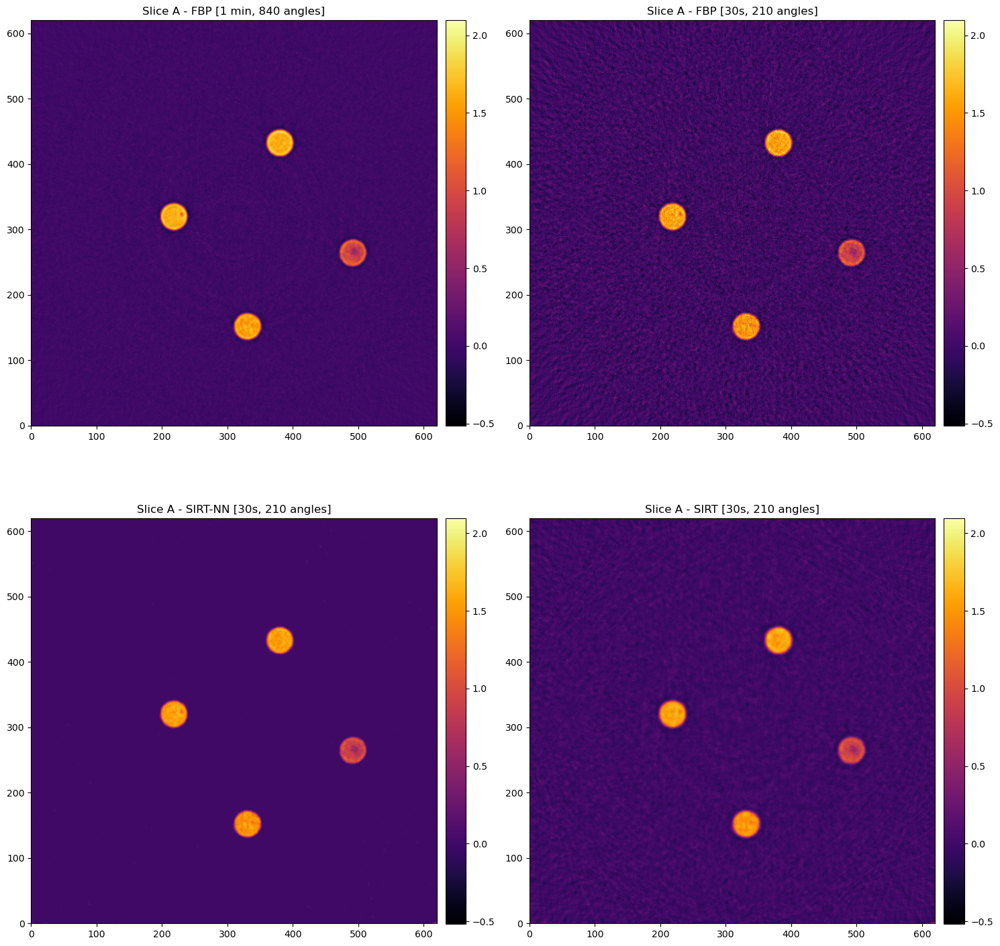

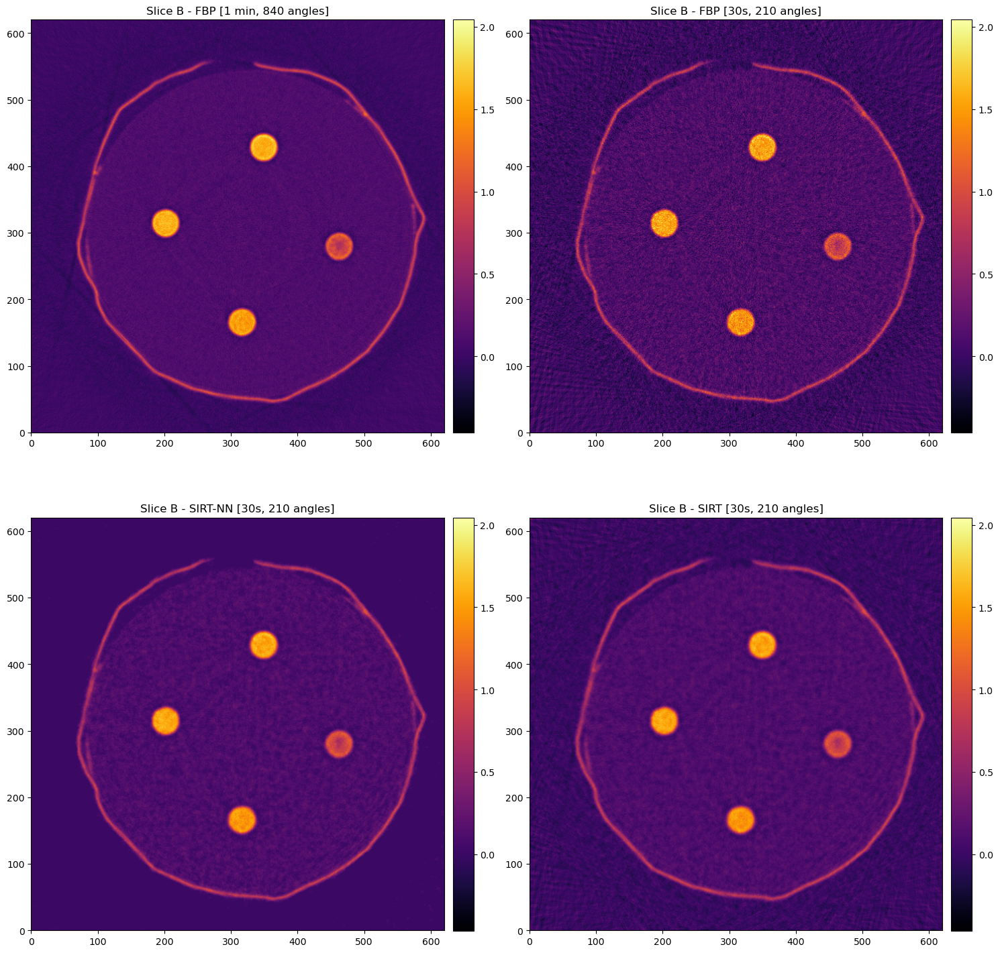

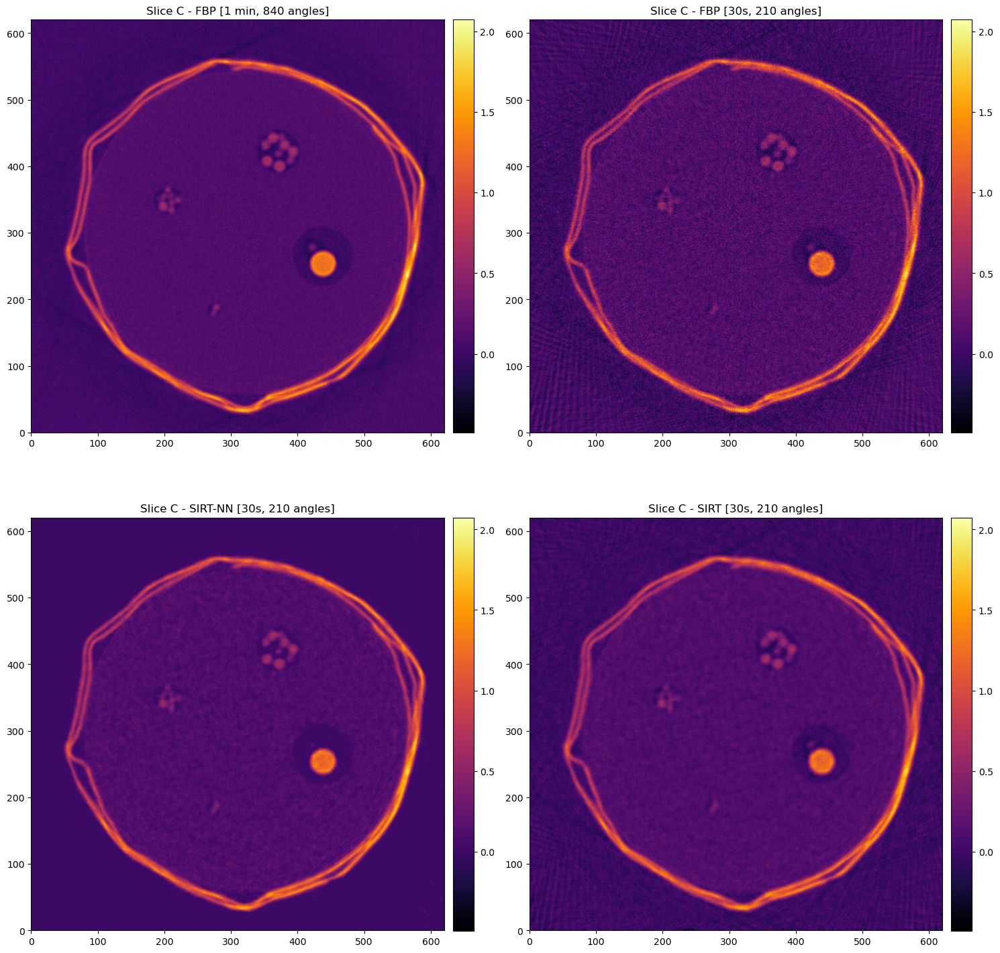

In [10]:

for i, slice_label in enumerate(['A', 'B', 'C']):
    SIRT_results = [sliced_recon_dict[x][i] for x in SIRT_titles]
    fbp_result = sliced_recon_dict['FBP [30s, 210 angles]'][i] 
    fbp_titles = [f"Slice {slice_label} - FBP [30s, 210 angles]"]

    full_fbp = sliced_recon_dict['FBP [1min, 840 angles]'][i]

    vmin = np.min(fbp_result.array.min())
    vmax = np.max(fbp_result.array.max())

    titles = [f"Slice {slice_label} - FBP [1 min, 840 angles]", f"Slice {slice_label} - FBP [30s, 210 angles]", f"Slice {slice_label} - SIRT-NN [30s, 210 angles]", f"Slice {slice_label} - SIRT [30s, 210 angles]"]

    show2D([x.array for x in [full_fbp, fbp_result, SIRT_results[0], SIRT_results[1]]], title=titles, cmap='inferno', fix_range=(vmin, vmax), num_cols=2)



### Evaluation of alpha with Line profiles and Metrics

We'll be looking at ROIs relating to rods in the cylinder, which we'll refer to with numbered labels as shown in this image:

<img src="images/cylinder_regions.png" width=800 align="center">

First of all let's look at the line profile through rod 4 in slice A, as we know it has a region of different material:

#### Contrast to Noise Ratio

In this section we will focus on slice B and evaluate the Contrast to Noise Ratio between the rods and the aluminium cylinder.

For each rod in slice B we first create an ROI which includes the rod and some aluminium cylinder background. We create this for all datasets but just display for the 60s exposure, 840 angles dataset:

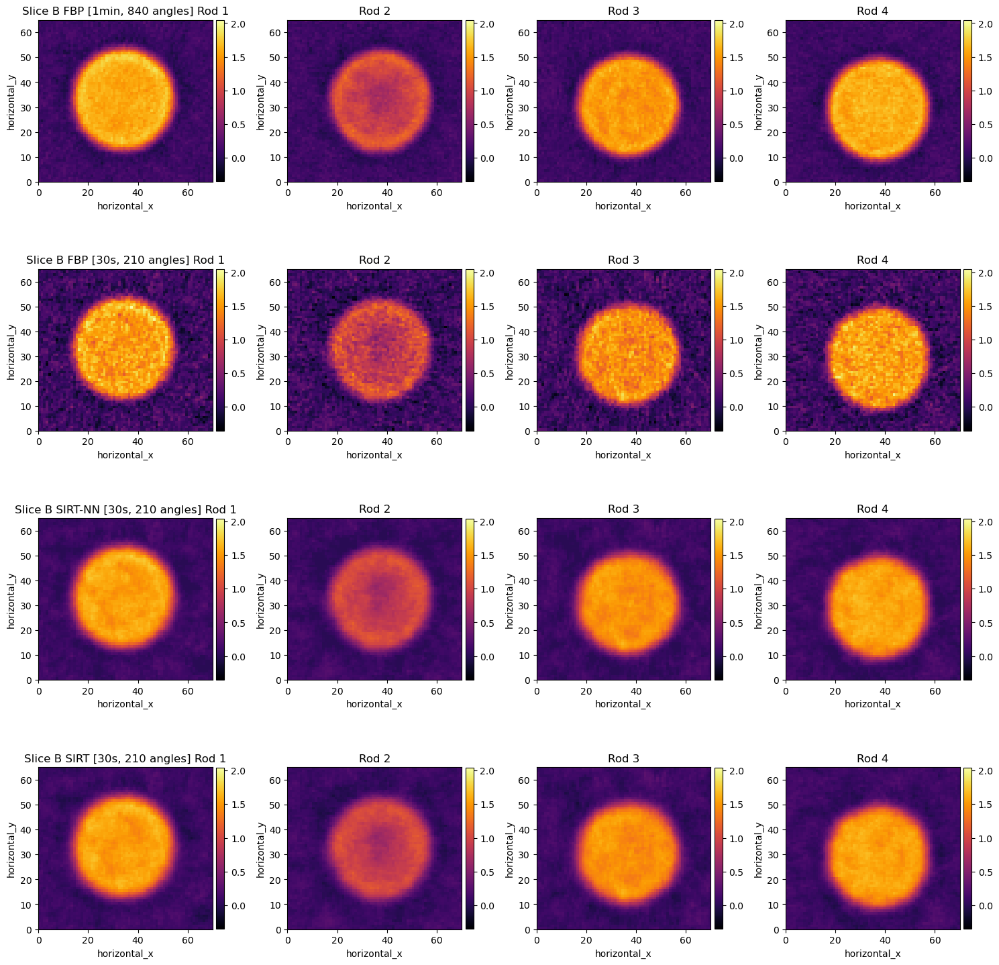

In [11]:
from utils.alum_cyl import crop_rod_B, get_slice_b_outer_rois

slice_B_data = get_slice_b_outer_rois(sliced_recon_dict)

all_rods_B = [rod for entry in slice_B_data.values() for rod in entry["rods"]]
all_labels_B = [label for entry in slice_B_data.values() for label in entry["labels"]]
min = np.min([np.min(r) for r in all_rods_B])
max = np.max([np.max(r) for r in all_rods_B])

show2D(all_rods_B,title=all_labels_B, num_cols=4, cmap="inferno", fix_range=(min, max));

One way we could examine the contrast is using a line profile through this ROI. We display this for rod 1:

In [12]:
labels = list(sliced_recon_dict.keys())

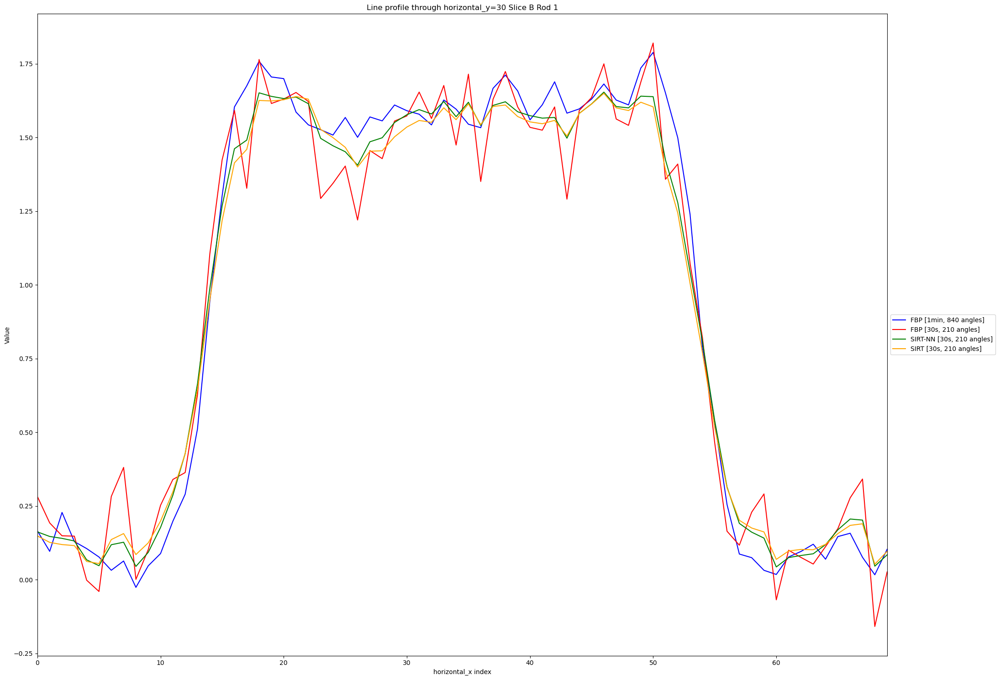

In [13]:
linenumy = 30

rods = [slice_B_data[x]["rods"][0] for x in slice_B_data.keys()]

show1D(rods,
        slice_list=[('horizontal_y',linenumy)],
        title='Line profile through horizontal_y=30 Slice B Rod 1',
        dataset_labels=[str(s) for s in slice_B_data.keys()],
        line_colours=['blue','red','green','orange', 'purple', 'cyan', 'grey'],
        line_styles=['solid']*7,
        size=(22, 15))

Next we create ROIs with only the material inside each rod, plus an additional ROI of the aluminium cylinder - 'background'.

In [14]:
def get_slice_b_inner_rois(sliced_recon_dict):
    slice_B_data = get_slice_b_outer_rois(sliced_recon_dict)
    data_labels = [ x for x in slice_B_data.keys()]

    for data_label in data_labels:
        slice_B_data[data_label]['rods_inner'] = []
        for i in range(4):
            data = slice_B_data[data_label]["rods"][i]
            roi_img = Slicer(roi={'horizontal_x': (25,45), 'horizontal_y': (25,45)})(data)
            slice_B_data[data_label]['rods_inner'].append(roi_img)
    for data_label in data_labels:
        rec = sliced_recon_dict[data_label][1]
        bkg = Slicer(roi = {'horizontal_x': (300, 320), 'horizontal_y': (400, 420)})(rec)
        label = "Aluminium Cylinder"
        slice_B_data[data_label]["rods_inner"].append(bkg)
        slice_B_data[data_label]["labels"].append(label)


    return slice_B_data

In [15]:
slice_B_data = get_slice_b_inner_rois(sliced_recon_dict)

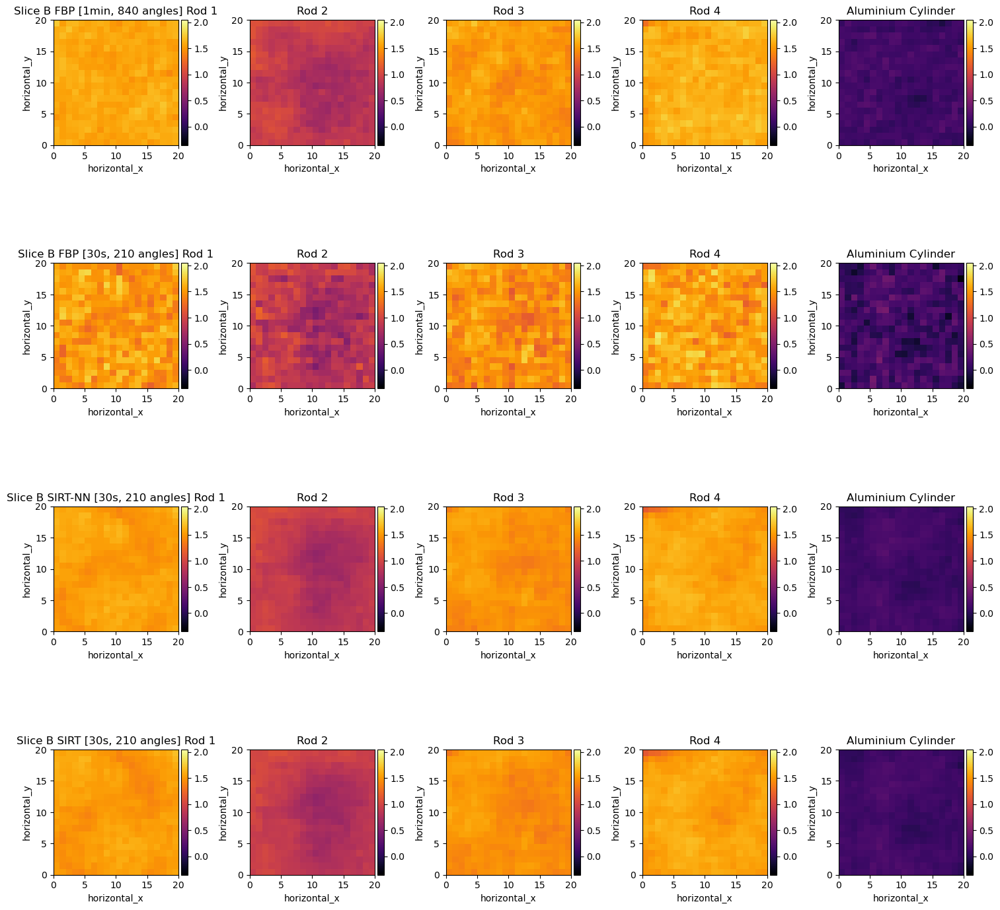

In [16]:
# To show all regions:
show2D([item for sublist in [slice_B_data[x]['rods_inner'] for x in labels] for item in sublist], 
       [item for sublist in [slice_B_data[x]['labels'] for x in labels] for item in sublist],
       fix_range=(min,max), cmap='inferno', num_cols=5)

##### Contrast to Noise Ratio (CNR)
This metric assesses the contrast between the background and the ROI.
&nbsp;

Method:
&nbsp;

$$
\text{CNR} = \frac{\text{Mean of ROI} - \text{Mean of Background}}{\text{Standard Deviation of Background}}
$$
&nbsp;

We will compare an ROI within each rod with an ROI in the aluminium cylinder - 'background', in slice B.

In [17]:
from utils.metrics import calculate_cnr

In [18]:
data_labels = [ x for x in slice_B_data.keys()]
for data_label in data_labels:
    slice_B_data[data_label]['cnrs'] = []
    for i in range(4):
        data = slice_B_data[data_label]["rods_inner"][i]
        bkg_data = slice_B_data[data_label]["rods_inner"][4]
        slice_B_data[data_label]['cnrs'].append(calculate_cnr(data, bkg_data))

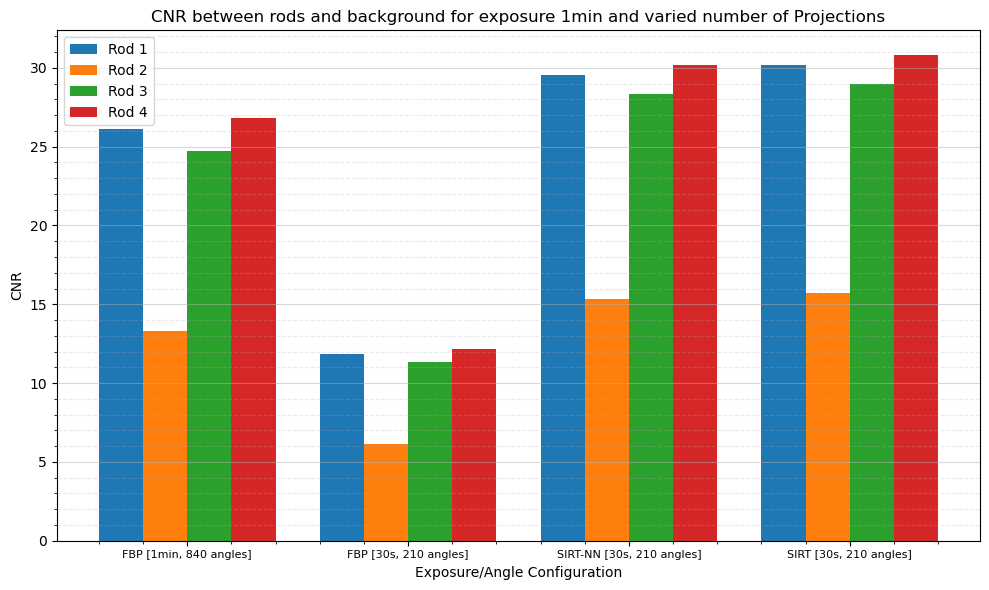

In [19]:
x = np.arange(len(labels))  # x locations for the groups

width = 0.2  # bar width

plt.figure(figsize=(10, 6))

for i in range(4):
    cnrs = [slice_B_data[x_label]['cnrs'][i] for x_label in list(slice_B_data.keys())]
    plt.bar(x + i * width - 1.5*width, cnrs, width, label=f'Rod {i+1}')

plt.xticks(x, labels, fontsize=8)
plt.xlabel('Exposure/Angle Configuration')
plt.ylabel('CNR')
plt.title('CNR between rods and background for exposure 1min and varied number of Projections')
plt.legend()
plt.tight_layout()
plt.minorticks_on()
plt.grid(axis='y', which='major', linestyle='-', alpha=0.5)
plt.grid(axis='y', which='minor', linestyle='--', alpha=0.25)
plt.show()


### Signal to Noise Ratio (SNR)
This is the ratio of signal compared to noise in the region. 
&nbsp;

Method:
&nbsp;

$$
\text{SNR} = \frac{\text{Mean of ROI}}{\text{Standard Deviation of ROI}}
$$
&nbsp;

We will be using the Slice B dataset to apply SNR of different angles/exposures through the cylinder background and the four rods.


In [20]:
from utils.metrics import calculate_snr

data_labels = [ x for x in slice_B_data.keys()]

for data_label in data_labels:
    slice_B_data[data_label]['snrs'] = []
    for i in range(5):
        data = slice_B_data[data_label]["rods_inner"][i]
        slice_B_data[data_label]['snrs'].append(calculate_snr(data))

In [21]:
from utils.alum_cyl import apply_plot_settings

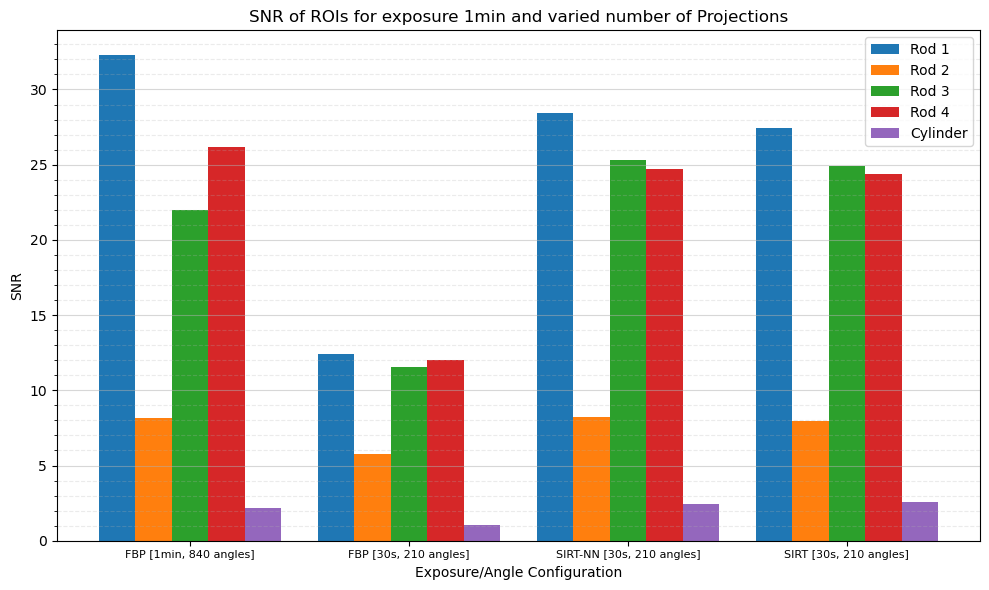

In [22]:
x = np.arange(len(labels))  # x locations for the groups

width = 1/6  # bar width

plt.figure(figsize=(10, 6))

for i in range(5):
    snrs = [slice_B_data[x]['snrs'][i] for x in list(slice_B_data.keys())]
    plt.bar(x + i * width - 2*width, snrs, width, label=f'Rod {i+1}' if i<4 else 'Cylinder')

plt.xticks(x, labels, fontsize=8)
plt.xlabel('Exposure/Angle Configuration')
plt.ylabel('SNR')
plt.title('SNR of ROIs for exposure 1min and varied number of Projections')
apply_plot_settings()
plt.show()


But what is the balance between the signal and the noise? Let's take a look at the signal values:

In [23]:
data_labels = [ x for x in slice_B_data.keys()]

for data_label in data_labels:
    slice_B_data[data_label]['signal_mean'] = []
    slice_B_data[data_label]['noise_std'] = []
    for i in range(5):
        data = slice_B_data[data_label]["rods_inner"][i]
        slice_B_data[data_label]['signal_mean'].append(np.mean(data))
        slice_B_data[data_label]['noise_std'].append(np.std(data.array))

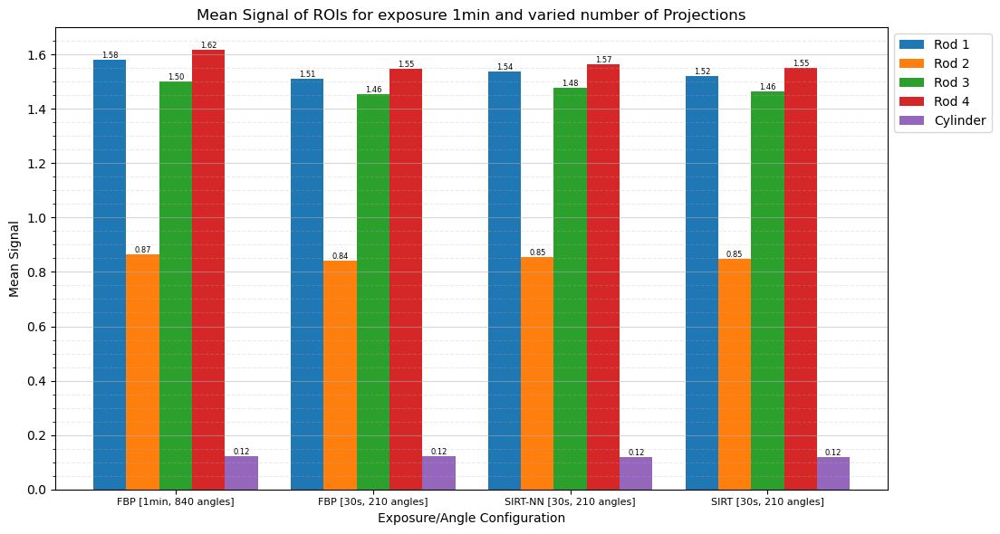

In [24]:
x = np.arange(len(labels)) # x locations for the groups

width = 1/6  # bar width

plt.figure(figsize=(10, 6))

for i in range(5):
    signal_mean = [slice_B_data[x]['signal_mean'][i] for x in list(slice_B_data.keys())]
    plt.bar(x + i * width - 2*width, signal_mean, width, label=f'Rod {i+1}' if i<4 else 'Cylinder')
    # show values on bars:
    for j in range(len(signal_mean)):
        plt.text(x[j] + i * width - 2*width, signal_mean[j], f'{signal_mean[j]:.2f}', ha='center', va='bottom', fontsize=6)

plt.xticks(x, labels[0:4], fontsize=8)
plt.xlabel('Exposure/Angle Configuration')
plt.ylabel('Mean Signal')
plt.title('Mean Signal of ROIs for exposure 1min and varied number of Projections')
apply_plot_settings()
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

The mean signal values in the SIRT reconstructions of the exposure 30s, angles 210 data are slightly closer than the FBP of that dataset to those in the FBP of the full data

### L2Norm Error (L2N-E)
This metric assess the difference in pixel values between a reconstruction and the ground truth.
&nbsp;

Method:
&nbsp;

$$
\text{L2N-E} = \frac{\| \text{Recon} - \text{Ground Truth} \|_2}{\| \text{Ground Truth} \|_2}
$$
&nbsp;

We will be applying this metric on datasets of Slices A, B and C to compare the L2N-E of different angles/exposures with the ground truth.

In [25]:
from utils.metrics import calculate_L2Norm_error

In [26]:
# --- Define slice labels and corresponding ground truths ---
slice_indices = {'A': 0, 'B': 1, 'C': 2}
ground_truths = {k: sliced_recon_dict['FBP [1min, 840 angles]'][v] for k, v in slice_indices.items()}

# --- Initialize structure for storing errors ---
l2_errors = {k: [] for k in slice_indices.keys()}

# --- Compute L2Norm errors for each configuration ---
for recs in sliced_recon_dict.values():
    for slice_key, idx in slice_indices.items():
        l2_errors[slice_key].append(
            calculate_L2Norm_error(ground_truths[slice_key], recs[idx])
        )



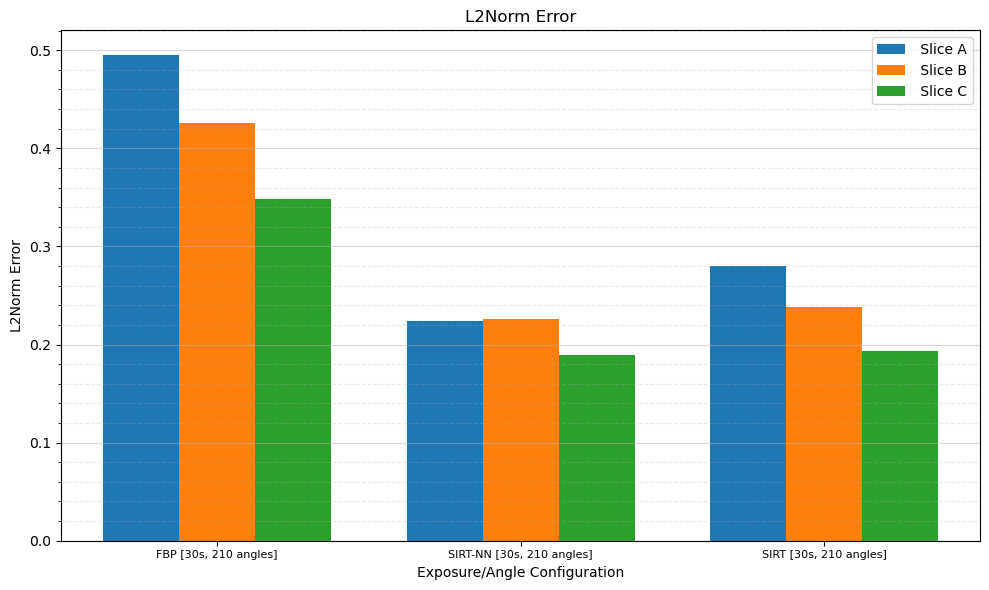

In [27]:
x = np.arange(len(labels[1:]))  # x locations for the groups

width = 0.25

plt.figure(figsize=(10, 6))

i=0
for slice_key, errors in l2_errors.items():
    plt.bar(x+ i * width - width, errors[1:], width, label=f' Slice {slice_key}')
    i+=1

plt.xticks(x, labels[1:], fontsize=8)
plt.xlabel('Exposure/Angle Configuration')
plt.ylabel('L2Norm Error')
plt.title('L2Norm Error')
apply_plot_settings()
plt.show()


This section takes three different ROI from the three slices and applies the L2Norm Error metric. This is done to study the behaviour of the metric with respect to object size.
First we will display the 3 different ROIs in the 1min exposure data vs the 7.5s exposure data, both with 840 angles. Then we will display the L2Norm calculation results.

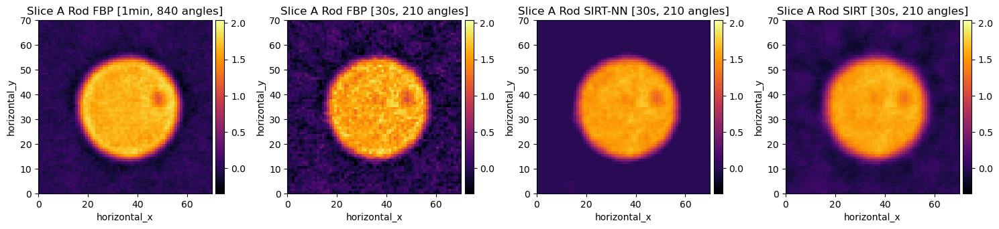

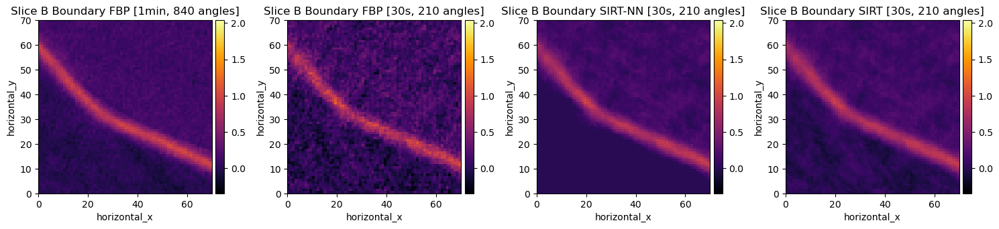

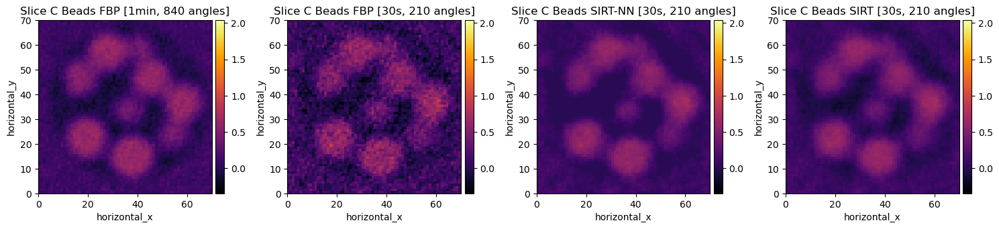

In [28]:
slicer_rod = Slicer(roi={'horizontal_x': (182, 252), 'horizontal_y': (285, 355)})
slicer_boundary = Slicer(roi={'horizontal_x': (160, 230), 'horizontal_y': (60, 130)})
slicer_beads = Slicer(roi={'horizontal_x': (335, 405), 'horizontal_y': (385, 455)})


slice_A_data,  slice_C_data = {}, {}

for key in data_labels:
    slice_A_data[key] = {"L2NormROI": slicer_rod(sliced_recon_dict[key][0])}
    slice_B_data[key]["L2NormROI"] =  slicer_boundary(sliced_recon_dict[key][1])
    slice_C_data[key] = {"L2NormROI": slicer_beads(sliced_recon_dict[key][2])}

# --- Select ground truth samples ---
ground_truth_a = slice_A_data["FBP [1min, 840 angles]"]["L2NormROI"]
ground_truth_b = slice_B_data["FBP [1min, 840 angles]"]["L2NormROI"]
ground_truth_c = slice_C_data["FBP [1min, 840 angles]"]["L2NormROI"]

show2D([slice_A_data[key]["L2NormROI"] for key in data_labels], title=[f'Slice A Rod {key}' for key in data_labels], fix_range=(min,max), cmap='inferno', num_cols=4);
show2D([slice_B_data[key]["L2NormROI"] for key in data_labels], title=[f'Slice B Boundary {key}' for key in data_labels], fix_range=(min,max), cmap='inferno', num_cols=4);
show2D([slice_C_data[key]["L2NormROI"] for key in data_labels], title=[f'Slice C Beads {key}' for key in data_labels], fix_range=(min,max), cmap='inferno', num_cols=4);

Let's also take a look at the line profile through the rod, at a row where we can see the imperfection in the rod - it's interesting to see how well this is maintained:

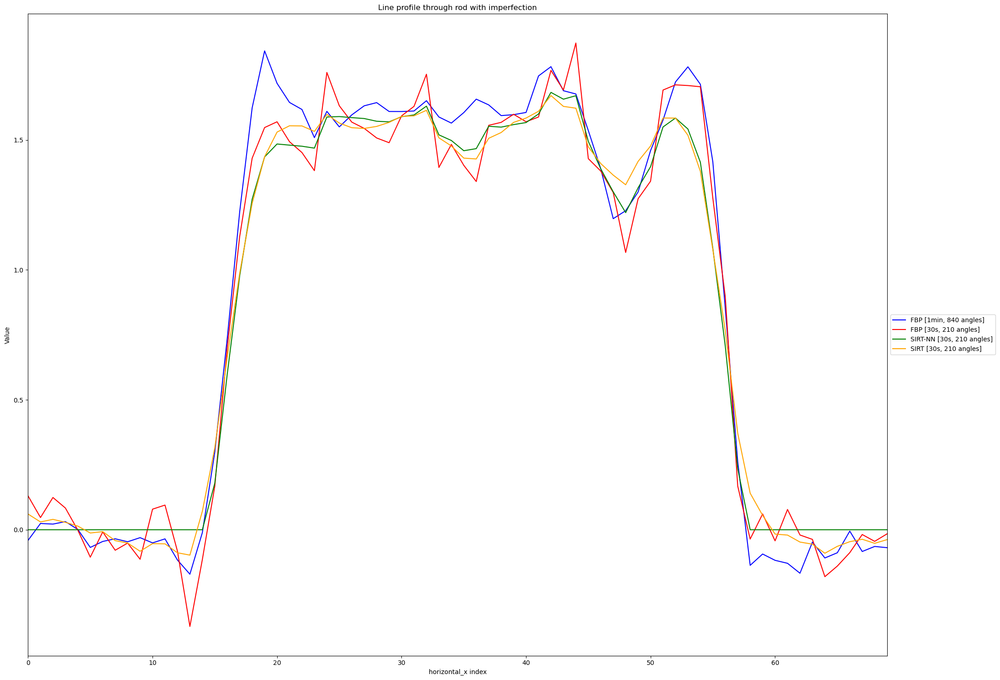

In [29]:
linenumy = 39

rods = [slice_A_data[x]["L2NormROI"] for x in slice_B_data.keys()]

show1D(rods,
        slice_list=[('horizontal_y',linenumy)],
        title='Line profile through rod with imperfection',
        dataset_labels=labels,
        line_colours=['blue','red','green','orange', 'purple', 'cyan', 'grey'],
        line_styles=['solid']*7,
        size=(22, 15))

The regions of air in the sample are where we see the real difference between SIRT with and without the non-negativity constraint.
This line profile shows the boundary between air and a rod in slice A. 

Without the non-negativity constraint, the air region is much noisier, with values largely below zero, which we know is incorrect as negative attenuation isn't possible! With the non-negativity constraint the noise has been smoothed out.

The air regions can also be seen to be smoother in the ROIs shown above - for slice A we see this ROI of the rod and air background. On slice B the ROI is between the aluminium cylinder and air background. We see smoothing of the air background when we have the non-negativity constraint.

In [30]:
for key in data_labels:
    slice_A_data[key]['L2Norm'] = calculate_L2Norm_error(ground_truth_a, slice_A_data[key]['L2NormROI'], apply_mask=False)
    slice_B_data[key]['L2Norm'] = calculate_L2Norm_error(ground_truth_b, slice_B_data[key]['L2NormROI'], apply_mask=False)
    slice_C_data[key]['L2Norm'] = calculate_L2Norm_error(ground_truth_c, slice_C_data[key]['L2NormROI'], apply_mask=False)

slice_A = [slice_A_data[key]['L2Norm'] for key in data_labels]
slice_B = [slice_B_data[key]['L2Norm'] for key in data_labels]
slice_C = [slice_C_data[key]['L2Norm'] for key in data_labels]

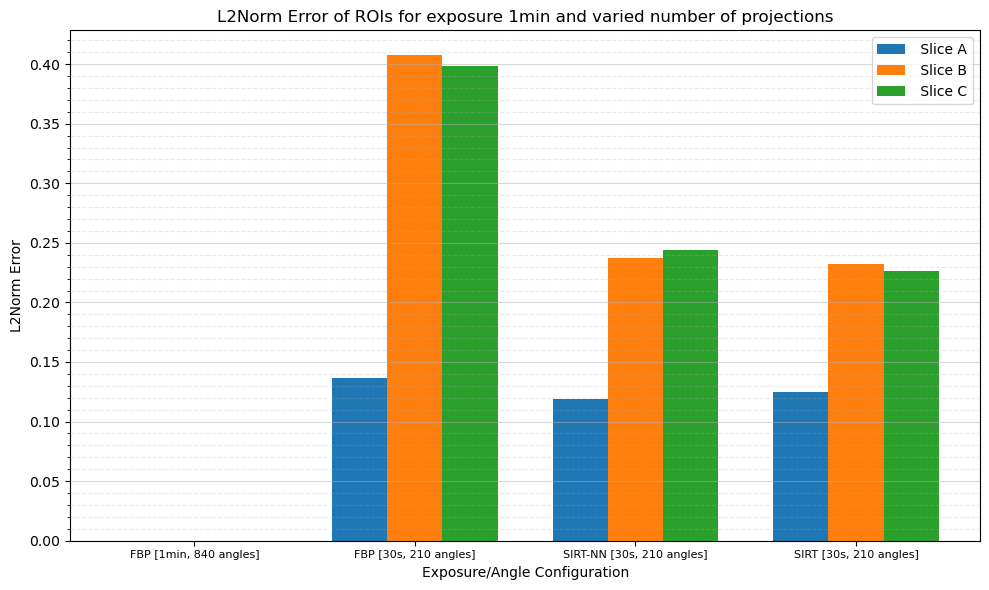

In [31]:
x = np.arange(len(labels))

width = 0.25

plt.figure(figsize=(10, 6))
plt.bar(x - width, slice_A, width, label=f' Slice A')
plt.bar(x, slice_B, width, label=f' Slice B')
plt.bar(x + width, slice_C, width, label=f' Slice C')

plt.xticks(x, labels, fontsize=8)
plt.xlabel('Exposure/Angle Configuration')
plt.ylabel('L2Norm Error')
plt.title('L2Norm Error of ROIs for exposure 1min and varied number of projections')
apply_plot_settings()
plt.show()


The SIRT reconstruction of the reduced (1/2 exposure, 1/4 angle) dataset has improved SNR and CNR ratio even compared to the FBP of the full data.

The L2Norm Error between the SIRT reconstruction of the reduced (1/2 exposure, 1/4 angle) dataset and the full FBP is reduced compared to the FBP of the full dataset. Comparing to notebook Angles_vs_Exposure_02, we see that the L2Norm Error for SIRT (1/2 exposure, 1/4 angle) is smaller than for FBP (full exposure, 1/4 angles), across all slices and ROIs except for the Slice A ROI. Note: the  (full exposure, 1/4 angles) took double the total time to acquire!

Overall SIRT, with or without non-negativity has been showcased to be able to retrieve quality from reduced data.
Further investigations would be required to provide advise on how much reconstructions with SIRT can allow acquisition times to be reduced in general.